# ***Grounding DINO-  SOTA Zero-Shot Object Detection***

***Grounding DINO aims to merge concepts found in the DINO and GLIP. DINO, a transformer-based detection method, offers state-of-the-art object detection performance and end-to-end optimization, eliminating the need for handcrafted modules like NMS (Non-Maximum Suppression).***

***GLIP focuses on phrase grounding. This task involves associating phrases or words from a given text with corresponding visual elements in an image or video, effectively linking textual descriptions to their respective visual representations.***

In [ ]:
!git clone https://github.com/IDEA-Research/GroundingDINO.git

In [3]:
cd GroundingDINO

/content/drive/MyDrive/Colab Notebooks/grounding_dino/GroundingDINO


## Installing Dependencies

In [5]:
!pip install -q -r requirements.txt
!pip install -q .
!pip install -q .

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 59.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 98.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 118.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 87.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 34.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done


***Importing Necessary Libraries***

In [6]:
cd ..

/content/drive/MyDrive/Colab Notebooks/grounding_dino


In [9]:
!pip install git+https://github.com/facebookresearch/segment-anything.git

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-pctzra7a
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-pctzra7a
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36586 sha256=5bab11fa3252d478d905f25a3cdeef8eb7a6eed5330df664be3a0a4d88cf94aa
  Stored in directory: /tmp/pip-ephem-wheel-cache-f83y5ih2/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


In [7]:
!pip install diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 15.3 MB/s eta 0:00:00


In [10]:
import argparse
import copy

from IPython.display import display
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert

# Grounding DINO
import GroundingDINO.groundingdino.datasets.transforms as T
from GroundingDINO.groundingdino.models import build_model
from GroundingDINO.groundingdino.util import box_ops
from GroundingDINO.groundingdino.util.slconfig import SLConfig
from GroundingDINO.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap
from GroundingDINO.groundingdino.util.inference import annotate, load_image, predict

import supervision as sv

# segment anything
from segment_anything import build_sam, SamPredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt


# diffusers
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline


from huggingface_hub import hf_hub_download

*To check if GPU is Present*

In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [12]:
def load_model_hf(repo_id, filename, ckpt_config_filename, device='cpu'):
    cache_config_file = hf_hub_download(repo_id=repo_id, filename=ckpt_config_filename)

    args = SLConfig.fromfile(cache_config_file)
    args.device = device
    model = build_model(args)

    cache_file = hf_hub_download(repo_id=repo_id, filename=filename)
    checkpoint = torch.load(cache_file, map_location=device)
    log = model.load_state_dict(clean_state_dict(checkpoint['model']), strict=False)
    print("Model loaded from {} \n => {}".format(cache_file, log))
    _ = model.eval()
    return model

***# Loading Grounding Dino for Zero Shot Object Detection***

In [13]:
pwd

'/content/drive/MyDrive/Colab Notebooks/grounding_dino'

In [16]:
ckpt_repo_id = "ShilongLiu/GroundingDINO"
ckpt_filenmae = "groundingdino_swinb_cogcoor.pth"
ckpt_config_filename = "GroundingDINO_SwinB.cfg.py"

groundingdino_model = load_model_hf(ckpt_repo_id, ckpt_filenmae, ckpt_config_filename, device)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


**Installing Weights**

In [17]:
! wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

checkpoint = 'sam_vit_h_4b8939.pth'

predictor = SamPredictor(build_sam(checkpoint=checkpoint).to(device))

--2023-10-14 07:50:43--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.162.163.34, 3.162.163.11, 3.162.163.19, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.162.163.34|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G  57.7MB/s    in 43s     

2023-10-14 07:51:26 (56.7 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



## **Loading an Input Image to check the predictions**

In [18]:
pwd

'/content/drive/MyDrive/Colab Notebooks/grounding_dino'

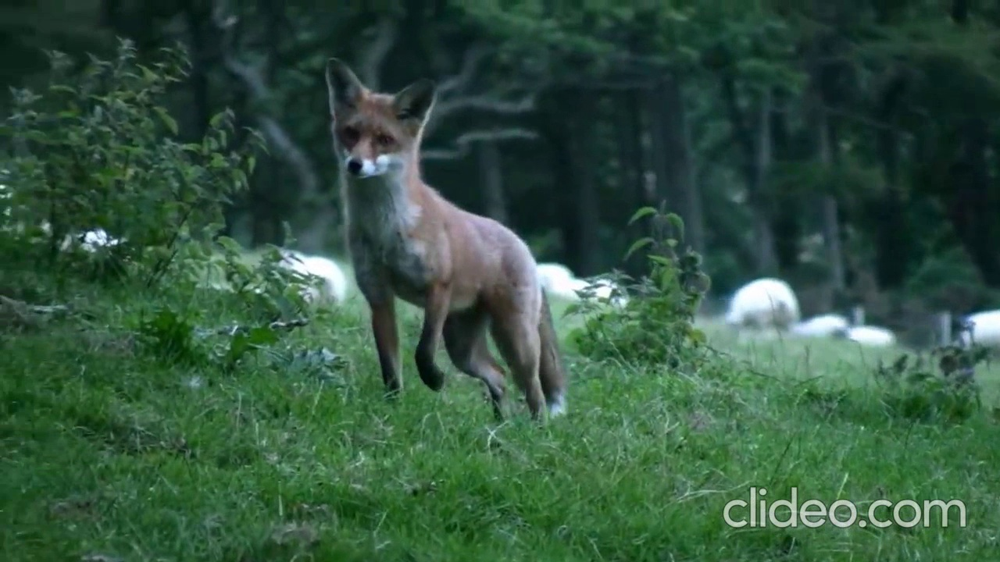

In [20]:
image_path='sample1.jpg'
image_source, image = load_image(image_path)
Image.fromarray(image_source)

In [21]:
# detect object using grounding DINO
def detect(image, text_prompt, model, box_threshold = 0.3, text_threshold = 0.25):
  boxes, logits, phrases = predict(
      model=model,
      image=image,
      caption=text_prompt,
      box_threshold=box_threshold,
      text_threshold=text_threshold
  )

  annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
  annotated_frame = annotated_frame[...,::-1] # BGR to RGB
  return annotated_frame, boxes

***Here we define object to detect in the Image***

In [22]:
object_to_segment = "fox"

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:905: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


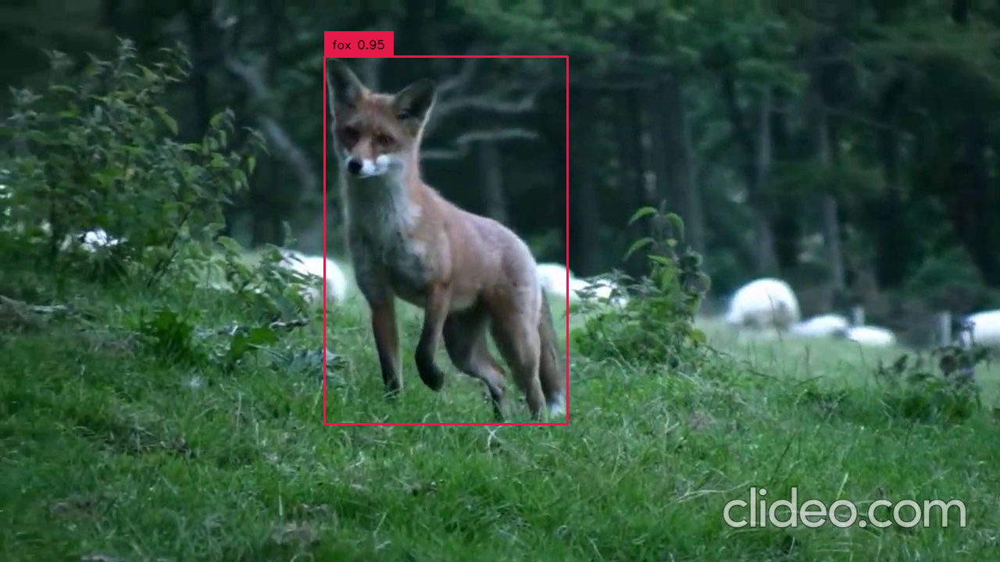

In [23]:
annotated_frame, detected_boxes = detect(image, text_prompt=object_to_segment, model=groundingdino_model)
Image.fromarray(annotated_frame)

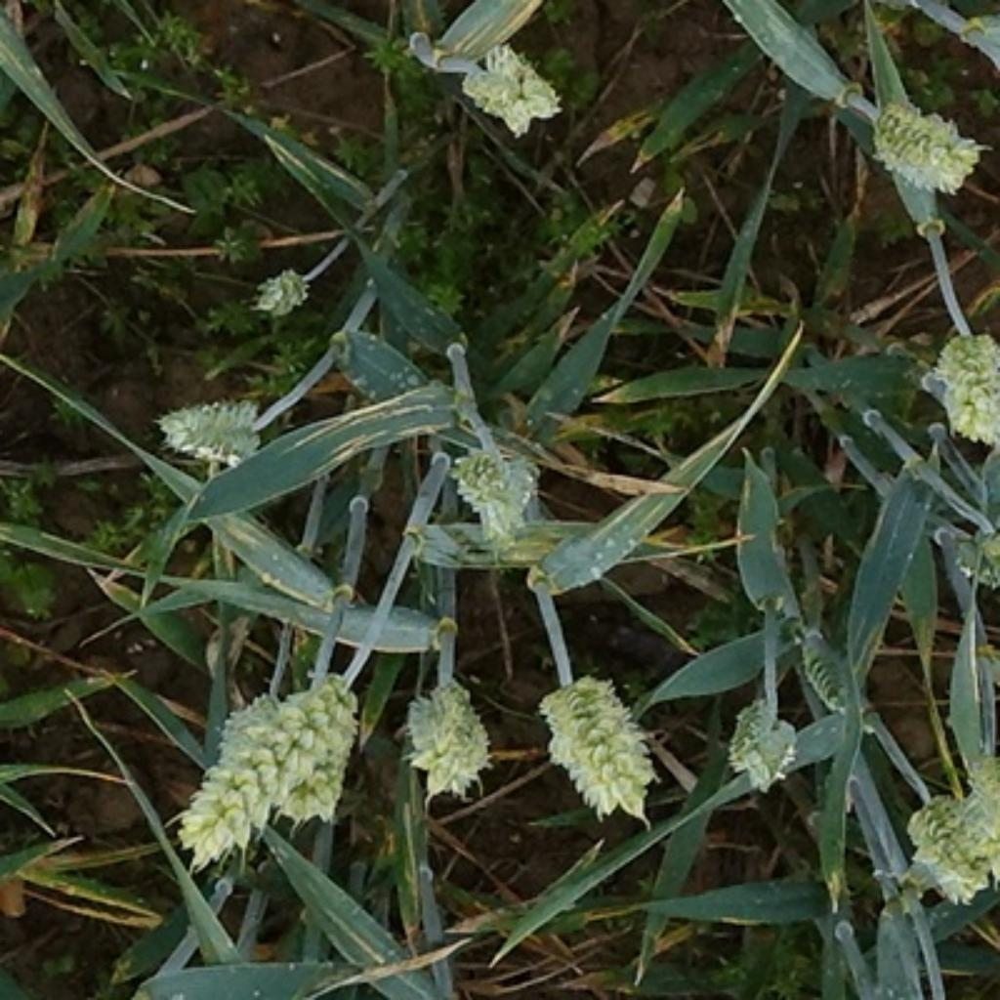

In [24]:
image_path='wheat1.jpg'
image_source, image = load_image(image_path)
Image.fromarray(image_source)

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:905: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


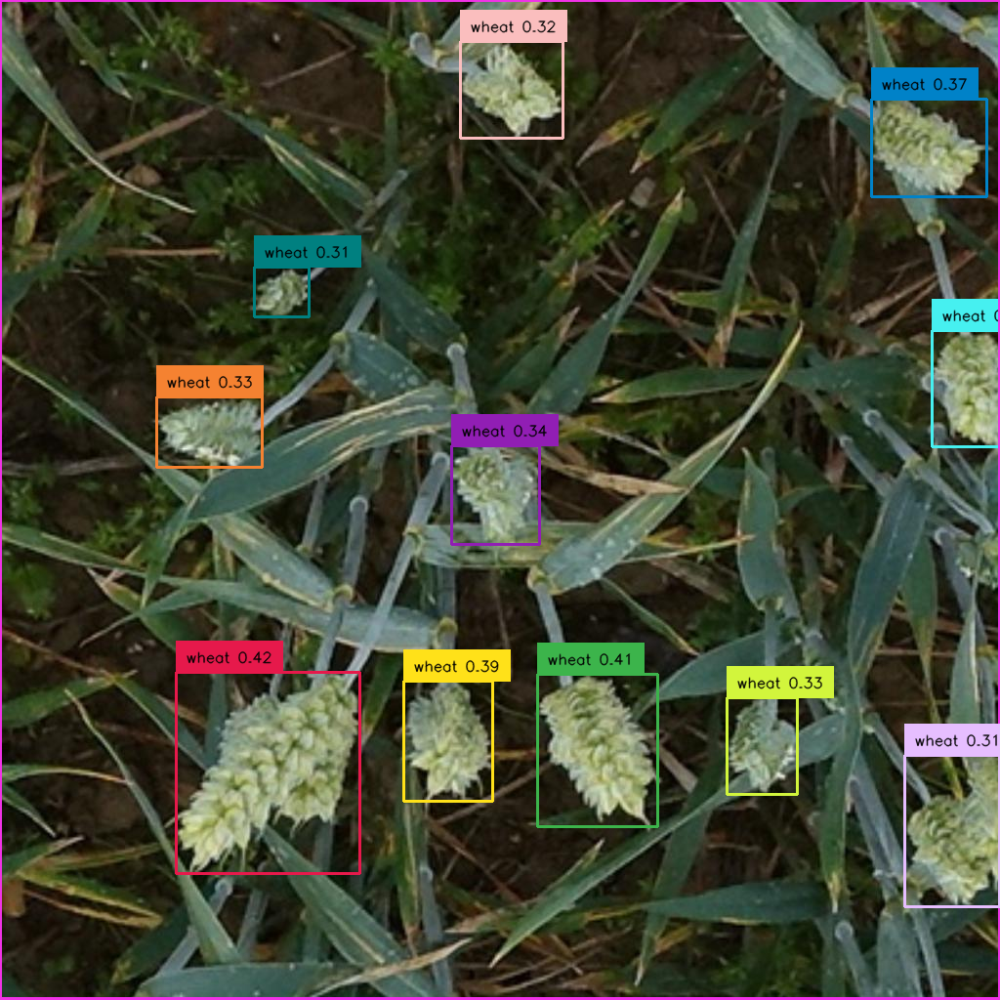

In [25]:
annotated_frame, detected_boxes = detect(image, text_prompt='wheat', model=groundingdino_model)
Image.fromarray(annotated_frame)

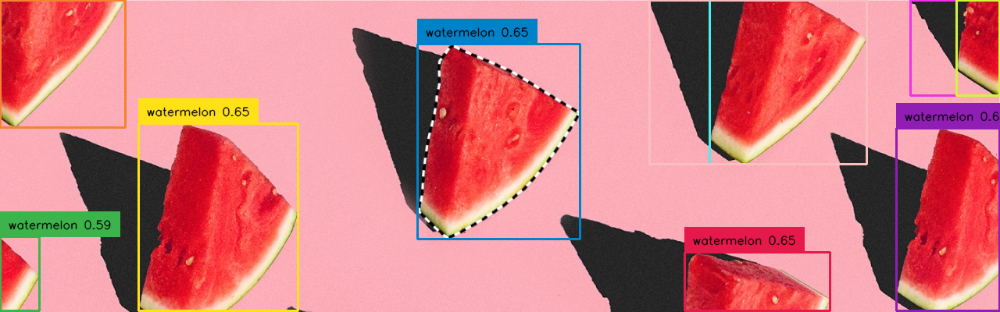

In [27]:
image_source, image = load_image('1.jpg')
Image.fromarray(image_source)
annotated_frame, detected_boxes = detect(image, text_prompt='watermelon', model=groundingdino_model)
Image.fromarray(annotated_frame)

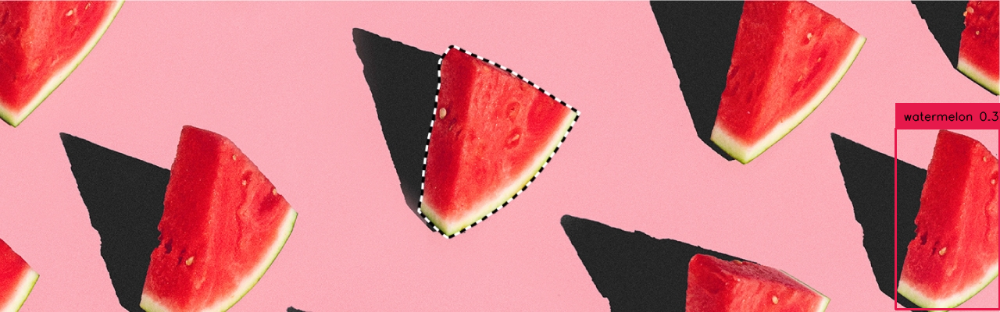

In [28]:
image_source, image = load_image('1.jpg')
Image.fromarray(image_source)
annotated_frame, detected_boxes = detect(image, text_prompt='watermelon which is in right side', model=groundingdino_model)
Image.fromarray(annotated_frame)

In [29]:
def segment(image, sam_model, boxes):
  sam_model.set_image(image)
  H, W, _ = image.shape
  boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])

  transformed_boxes = sam_model.transform.apply_boxes_torch(boxes_xyxy.to(device), image.shape[:2])
  masks, _, _ = sam_model.predict_torch(
      point_coords = None,
      point_labels = None,
      boxes = transformed_boxes,
      multimask_output = False,
      )
  return masks.cpu()


def draw_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

## **Viewing Segmented Object with Bounding Box**

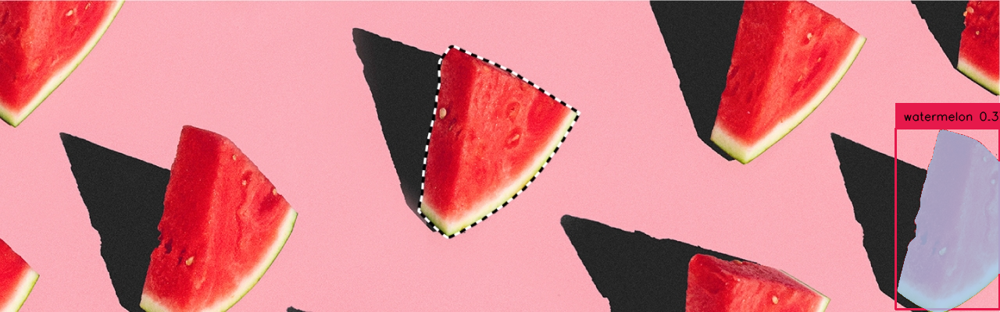

In [31]:
segmented_frame_masks = segment(image_source, predictor, boxes=detected_boxes)
annotated_frame_with_mask = draw_mask(segmented_frame_masks[0][0], annotated_frame)
Image.fromarray(annotated_frame_with_mask)

**Viewing Segmented Object without Bounding Box**

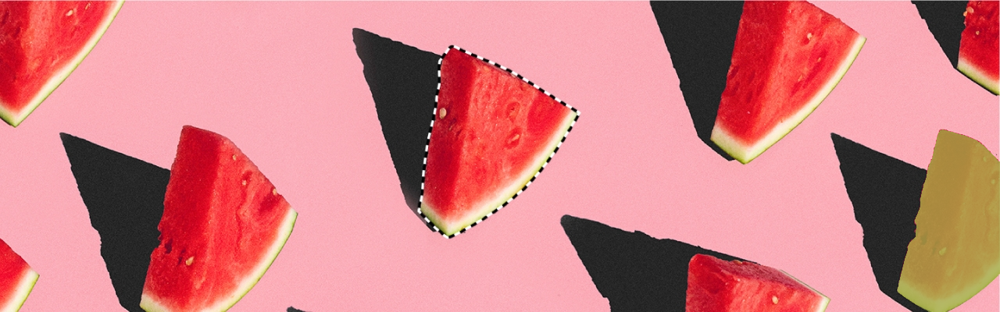

In [34]:
segmented_frame_masks = segment(image_source, predictor, boxes=detected_boxes)
annotated_frame_with_mask = draw_mask(segmented_frame_masks[0][0], image_source)
Image.fromarray(annotated_frame_with_mask)

***Advantages of Grounding DINO***

**Zero-Shot Object Detection**—Grounding DINO excels at detecting objects even when they are not part of the predefined set of classes in the training data. This unique capability enables the model to adapt to novel objects and scenarios, making it highly versatile and applicable to various real-world tasks.

Referring Expression Comprehension(REC)—Identifying and localizing a specific object or region within an image is based on a given textual description. In other words, instead of detecting people and chairs in an image and then writing custom logic to determine whether a chair is occupied, prompt engineering can be used to ask the model to detect only those chairs where a person is sitting. This requires the model to possess a deep understanding of both the language and the visual content, as well as the ability to associate words or phrases with corresponding visual elements.

Elimination of Hand-Designed Components like NMS—Grounding DINO simplifies the object detection pipeline by removing the need for hand-designed components, such as Non-Maximum Suppression (NMS). This streamlines the model architecture and training process while improving efficiency and performance.